## Embarassingly simple with ConvNexts

In [1]:
import anndata
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision.transforms import RandomResizedCrop, Compose, RandomHorizontalFlip, RandomVerticalFlip, Resize

from torch.utils.data import DataLoader
from tqdm import tqdm

# from functools import partial
from typing import Optional, Tuple, Type, Dict, List

from utils import DatasetFromTIFF, plot_markers, get_marker_names_map

In [2]:
import json

marker_map = json.load(open('tokenizer_vocab.json'))
markers_names_map = {v: k for k, v in marker_map.items()}

In [ ]:
class GlobalResponseNormalization(nn.Module):
    """Global Response Normalization (GRN) layer 
    from https://arxiv.org/pdf/2301.00808"""

    def __init__(self, dim, eps: float = 1e-6):
        super().__init__()
        self.eps = eps

        self.gamma = nn.Parameter(torch.zeros(1, 1, 1, dim))
        self.beta = nn.Parameter(torch.zeros(1, 1, 1, dim))

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        # B, H, W, E = x.shape

        gx = torch.norm(x, p=2, dim=(1,2), keepdim=True)
        nx = gx / (gx.mean(dim=-1, keepdim=True) + self.eps)
        return self.gamma * (x * nx) + self.beta + x


class ConvNextBlock(nn.Module):
    """ConvNext2 block"""
    def __init__(
            self,
            dim: int,
            inter_dim: int,
    ):
            super().__init__()
            self.conv1 = nn.Conv2d(dim, dim, kernel_size=7, padding=3, groups=dim)
            self.ln = nn.LayerNorm(dim)
            self.conv2 = nn.Linear(dim, inter_dim) # equivalent to nn.Conv2d(dim, inter_dim, kernel_size=1)
            self.act = nn.GELU()
            self.grn = GlobalResponseNormalization(inter_dim)
            self.conv3 = nn.Linear(inter_dim, dim) # equivalent to nn.Conv2d(inter_dim, dim, kernel_size=1)

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        # B, C, H, W = x.shape
        residual = x
        x = self.conv1(x)
        x = x.permute(0, 2, 3, 1)  # [B, H, W, C]
        x = self.ln(x)
        x = self.conv2(x)
        x = self.act(x)
        x = self.grn(x)
        x = self.conv3(x)
        x = x.permute(0, 3, 1, 2) # [B, C, H, W]
        x = x + residual

        return x


# class MLP(nn.Module):
#     """Standard MLP module"""
#     def __init__(
#             self, 
#             embedding_dim: int,
#             mlp_dim: int,
#             mlp_bias: bool = True,
#             act: Type[nn.Module] = nn.GELU,
#     ) -> None:
#         super().__init__()
#         self.mlp = nn.Sequential(
#             nn.Linear(embedding_dim, mlp_dim, bias=mlp_bias),
#             act(),
#             nn.Linear(mlp_dim, embedding_dim, bias=mlp_bias),
#         )

#     def forward(self, x: torch.Tensor) -> torch.Tensor:
#         return self.mlp(x)


class ConvNextBlocks(nn.Module):
    """Spatial convolutional blocks (per channel/marker)"""

    def __init__(
        self,
        embedding_dim: int,
        num_blocks: int = 1,
    ) -> None:
        """
        Args:
            dim (int): Number of input channels.
            num_blocks (int): Number of spatial convolutional blocks.
        """
        super().__init__()

        self.spatial_conv_blocks = nn.ModuleList()
        for _ in range(num_blocks):
            self.spatial_conv_blocks.append(
                ConvNextBlock(
                    dim=embedding_dim,
                    inter_dim=embedding_dim*4,
                )
            )
        

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        # B, C, H, W  = x.shape

        # Spatial convolutional blocks
        for block in self.spatial_conv_blocks:
            x = block(x)

        return x
    



# class MultiplexBlock(nn.Module):
#     """Multiplex Block integrating spatio-channel attention blocks."""

#     def __init__(
#         self,
#         num_blocks: int,
#         embedding_dim: int,
#         num_heads: int,
#     ) -> None:
#         """
#         Args:
#             num_blocks (int): Number of attention blocks.
#             dim (int): Number of input channels.
#             num_heads (int): Number of attention heads in each attention block.  
#         """
#         super().__init__()
#         self.blocks = nn.ModuleList()
#         for _ in range(num_blocks):
#             self.blocks.append(
#                 SpatioChannelAttention(
#                     embedding_dim=embedding_dim,
#                     num_heads=num_heads,
#                 )
#             )

#     def forward(self, x: torch.Tensor) -> torch.Tensor:
#         for block in self.blocks:
#             x = block(x)
#         return x
    

class MultiplexImageEncoder(nn.Module):
    """Multiplex Image encoder integrating spatial and cross-channel blocks."""

    def __init__(
        self,
        layers_blocks: List[int],
        embedding_dims: List[int],
        channel_embedding_dim: int,
        num_channels: int,
    ) -> None:
        """
        Args:
            layers_blocks (List[int]): Number of attention blocks in each layer.
            embedding_dims (List[int]): Number of input channels in each layer.
            channel_embedding_dim (int): Embedding dimension per channel pixel.
            num_channels (int): Maximal number of channels/markers (vocab dim).
        """
        super().__init__()
        self.channel_embedder = nn.Embedding(num_channels, channel_embedding_dim)
        self.init_norm = nn.BatchNorm2d(channel_embedding_dim)

        # self.stem = nn.Conv2d(channel_embedding_dim, embedding_dims[0], kernel_size=4, padding=0, stride=4)
        self.poolings = nn.ModuleList()
        self.poolings.append(
            nn.Conv2d(channel_embedding_dim, embedding_dims[0], kernel_size=2, padding=0, stride=2)
        )
        for i, out_dim in enumerate(embedding_dims[1:]):
            input_dim = embedding_dims[i]
            self.poolings.append(
                nn.Conv2d(input_dim, out_dim, kernel_size=2, padding=0, stride=2)
            )

        self.norms = nn.ModuleList()
        for dim in embedding_dims:
            self.norms.append(nn.BatchNorm2d(dim))
             
        self.blocks = nn.ModuleList()
        for blocks, dim in zip(layers_blocks, embedding_dims):
            self.blocks.append(
                ConvNextBlocks(
                    num_blocks=blocks,
                    embedding_dim=dim,
                )
            )
        
        # self.latent_proj = nn.Linear(embedding_dims[-1], latent_dim)
        # self.latent_norm = nn.LayerNorm(latent_dim)
        

    def forward(self, x: torch.Tensor, channel_ids: torch.Tensor) -> torch.Tensor:
        """Forward pass of the Multiplex Image Transformer.

        Args:
            x (torch.Tensor): Multiplex images batch tensor with shape [B, C, H, W]
            channel_ids (torch.Tensor): Channel ids tensor with shape [B, C]

        Returns:
            torch.Tensor: Embedding tensor
        """
        channel_embeds = self.channel_embedder(channel_ids) # [B, C, E]
        
        

        x = torch.einsum('bchw, bce -> behw', x, channel_embeds) # [B, E, H, W]
        x = self.init_norm(x)

        # poolings and blocks
        for pooling, norm, block in zip(self.poolings, self.norms, self.blocks):
            x = norm(pooling(x))
            x = block(x)
        
        # latent projection
        # x = self.latent_proj(x)
        # x = x.sum(dim=1, keepdim=True) # reduce over channels
        # x = self.latent_norm(x)

        return x



class MultiplexImageDecoder(nn.Module):
    """Decoder for MIT model restoring the original image shape, inspired by the one from FCMAE
    (see https://github.com/facebookresearch/ConvNeXt-V2/blob/main/models/fcmae.py)"""
    
    def __init__(
            self,
            input_embedding_dim: int,
            decoded_embed_dim: int,
            num_blocks: int,
            scaling_factor: int,
            output_channels: int,
        ) -> None:
            """
            Args:
                input_embedding_dim (int): Embedding dimension of the input tensor.
                decoded_embed_dim (int): Embedding dimension of the decoded tensor (before last projections).
                num_blocks (int): Number of multiplex blocks in each intermediate layer.
                scaling_factor (int): Scaling factor for the upsampling.
                output_channels (int): Number of output channels/markers.
            """
            super().__init__()
            self.scaling_factor = scaling_factor
            self.output_channels = output_channels
            self.decoded_embed_dim = decoded_embed_dim

            self.proj = nn.Conv2d(input_embedding_dim, decoded_embed_dim * output_channels, 1) # input projection
            self.decoder = ConvNextBlocks(
                num_blocks=num_blocks,
                embedding_dim=decoded_embed_dim,
            )

            self.pred = nn.Conv2d(decoded_embed_dim, scaling_factor**2, 1)

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        """Forward pass of the Multiplex Image Decoder.

        Args:
            x (torch.Tensor): Input tensor (embedding).

        Returns:
            torch.Tensor: Reconstructed image tensor
        """
        B, _, H, W = x.shape
        C, E, A = self.output_channels, self.decoded_embed_dim, self.scaling_factor

        x = self.proj(x) # [B, C*E, H, W]
        x = x.reshape(B, C, E, H, W).reshape(B*C, E, H, W) # decoder per channel
        x = self.decoder(x)
        x = self.pred(x)

        x = x.reshape(B*C, A, A, H, W).reshape(B, C, A, A, H, W)
        x = torch.einsum('bcxyhw -> bchxwy', x)
        x = x.reshape(B, C, H*A, W*A)

        return x


# class MultiplexImageDecoderFCMAESpatial(nn.Module):
#     """Decoder for MIT model restoring the original image shape, inspired by the one from FCMAE
#     (see https://github.com/facebookresearch/ConvNeXt-V2/blob/main/models/fcmae.py)"""
    
#     def __init__(
#             self,
#             input_embedding_dim: int,
#             decoded_embed_dim: int,
#             num_blocks: int,
#             scaling_factor: int,
#         ) -> None:
#             """
#             Args:
#                 input_embedding_dim (int): Embedding dimension of the input tensor.
#                 decoded_embed_dim (int): Embedding dimension of the decoded tensor (before last projections).
#                 num_blocks (int): Number of multiplex blocks in each intermediate layer.
#                 scaling_factor (int): Scaling factor for the upsampling.
#             """
#             super().__init__()
#             self.scaling_factor = scaling_factor
#             self.proj = nn.Linear(input_embedding_dim, decoded_embed_dim) # input projection
#             self.decoder = SpatialConvs(
#                 num_conv_blocks=num_blocks,
#                 embedding_dim=decoded_embed_dim,
#             )

#             self.pred = nn.Linear(decoded_embed_dim, scaling_factor**2)
    
#     def forward(self, x: torch.Tensor) -> torch.Tensor:
#         """Forward pass of the Multiplex Image Decoder.

#         Args:
#             x (torch.Tensor): Input tensor (embedding).

#         Returns:
#             torch.Tensor: Reconstructed image tensor
#         """
#         B, C, H, W, E = x.shape
#         N = B * C
#         x = self.proj(x)
#         x = x.reshape(N, H, W, -1)
#         x = self.decoder(x)
#         x = self.pred(x)
#         x = x.view(N, H, W, self.scaling_factor, self.scaling_factor)
#         x = x.permute(0, 1, 3, 2, 4).contiguous().view(N, H*self.scaling_factor, W*self.scaling_factor)
#         x = x.view(B, C, H*self.scaling_factor, W*self.scaling_factor)

#         return x
    


class MultiplexImageTransformer(nn.Module):
    """Multiplex Image Transformer model combining encoder and decoder."""

    def __init__(
        self,
        num_channels: int,
        channel_embedding_dim: int,
        encoder_layers_blocks: List[int],
        encoder_embedding_dims: List[int],
        decoder_dim: int,
        decoder_blocks_num: int,

    ) -> None:
        """
        Args:
            num_channels (int): Maximal number of channels/markers (vocab dim).
            channel_embedding_dim (int): Embedding dimension per channel pixel.
            encoder_layers_blocks (List[int]): Number of multiplex blocks in each layer.
            encoder_embedding_dims (List[int]): Input embedding dimensions in each layer.
            decoder_dim (int): Embedding dimension of the decoded tensor (before last projections).
            decoder_blocks_num (int): Number of multiplex blocks in the decoder.
        """

        super().__init__()
        self.encoder = MultiplexImageEncoder(
            layers_blocks=encoder_layers_blocks,
            embedding_dims=encoder_embedding_dims,
            channel_embedding_dim=channel_embedding_dim,
            num_channels=num_channels,
        )

        latent_dim = encoder_embedding_dims[-1]

        self.decoder = MultiplexImageDecoder(
            input_embedding_dim=latent_dim,
            decoded_embed_dim=decoder_dim,
            num_blocks=decoder_blocks_num,
            scaling_factor=2**(len(encoder_layers_blocks)),
            output_channels=num_channels,
        )

    
    def forward(self, 
                x: torch.Tensor, 
                channel_ids: torch.Tensor, 
                # mask_ids: torch.Tensor
            ) -> Tuple[torch.Tensor, torch.Tensor]:
        """Forward pass of the Multiplex Image Transformer.

        Args:
            x (torch.Tensor): Input image tensor of shape [B, C, H, W].
            channel_ids (torch.Tensor): Input channel ids tensor of shape [B, C].
            mask_ids (torch.Tensor): Input mask ids tensor of shape [B, m].

        Returns:
            Tuple[torch.Tensor, torch.Tensor]: Reconstructed image tensor and encoder embedding tensor.
        """
        encoded_x = self.encoder(x, channel_ids) # [B, C, H', W', E_latent]
        decoded_x = self.decoder(encoded_x) # [B, C, H, W]

        return decoded_x, encoded_x


In [4]:
device = 'cuda' if torch.cuda.is_available() else 'mps'

In [5]:
# default train and test functions for autoencoder training and inference

def train(model, optimizer, train_dataloader, val_dataloader, device, epochs=10, gradient_accumulation_steps=1):
    model.train()
    criterion = nn.MSELoss()
    for epoch in range(epochs):
        model.train()
        running_loss = 0.0
        for i, (img, channel_ids) in enumerate(tqdm(train_dataloader)):
            img = img.to(torch.float32).to(device)
            channel_ids = channel_ids.to(device)
            output, _ = model(img, channel_ids)
            loss = criterion(output, img)
            loss.backward()
            if (i+1) % gradient_accumulation_steps == 0:
                optimizer.step()
                optimizer.zero_grad()
            running_loss += loss.item()
                        
        print(f'Epoch {epoch} loss: {running_loss / len(train_dataloader)}')
        val_loss = test(model, val_dataloader, device)
        print(f'Validation loss: {val_loss}')

def test(model, test_dataloader, device):
    model.eval()
    criterion = nn.MSELoss()
    running_loss = 0.0
    with torch.no_grad():
        for img, channel_ids in test_dataloader:
            img = img.to(torch.float32).to(device)
            channel_ids = channel_ids.to(device)
            output, _ = model(img, channel_ids)
            loss = criterion(output, img)
            running_loss += loss.item()
    return running_loss / len(test_dataloader)

In [6]:
TRAIN_DATA_PATH = '/Users/dawid/Desktop/uw/rok IV/sem VIII/DLLS/DeepLearningProject/data/train/images_masks/img'
TEST_DATA_PATH = '/Users/dawid/Desktop/uw/rok IV/sem VIII/DLLS/DeepLearningProject/data/test/images_masks/img'
VAL_DATA_PATH = '/Users/dawid/Desktop/uw/rok IV/sem VIII/DLLS/DeepLearningProject/data/val/images_masks/img'

SIZE = (112, 112)
BATCH_SIZE = 1

train_transform = Compose([
        RandomResizedCrop(SIZE),
        RandomHorizontalFlip(0.5),
        RandomVerticalFlip(0.5)
])

test_transform = Resize(SIZE)

train_dataset = DatasetFromTIFF(TRAIN_DATA_PATH, transform=train_transform)
val_dataset = DatasetFromTIFF(VAL_DATA_PATH, transform=test_transform)
test_dataset = DatasetFromTIFF(TEST_DATA_PATH, transform=test_transform)

train_dataloader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True)
val_dataloader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False)
test_dataloader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False)

In [7]:
train_anndata = anndata.read_h5ad('/Users/dawid/Desktop/uw/rok IV/sem VIII/DLLS/DeepLearningProject/data/train/cell_data.h5ad')
markers_names_map = get_marker_names_map(train_anndata)

In [16]:
device = 'cuda' if torch.cuda.is_available() else 'mps'

encoder_layers_blocks = [3, 3, 3]
encoder_embedding_dims = [96, 192, 384]
# encoder_num_heads = [6, 6, 6]

decoder_dim = 192
decoder_blocks_num = 3
# decoder_num_heads = 6

# latent_dim = 384

model = MultiplexImageTransformer(
    channel_embedding_dim=96,
    num_channels=40,
    encoder_layers_blocks=encoder_layers_blocks,
    encoder_embedding_dims=encoder_embedding_dims,
    decoder_dim=decoder_dim,
    decoder_blocks_num=decoder_blocks_num,

).to(device)

In [17]:
lr = 5e-4
weight_decay = 0.001
gradient_accumulation_steps = 1
epochs = 20
optimizer = optim.AdamW(model.parameters(), lr=lr, weight_decay=weight_decay)

train(model, optimizer, train_dataloader, val_dataloader, device, epochs=epochs, gradient_accumulation_steps=gradient_accumulation_steps)

  0%|          | 0/100 [00:00<?, ?it/s]

100%|██████████| 100/100 [01:01<00:00,  1.61it/s]


Epoch 0 loss: 0.0229522238438949
Validation loss: 0.009157926458865404


100%|██████████| 100/100 [01:01<00:00,  1.64it/s]


Epoch 1 loss: 0.01046633859630674
Validation loss: 0.00803962478414178


100%|██████████| 100/100 [01:01<00:00,  1.63it/s]


Epoch 2 loss: 0.009516755831427873
Validation loss: 0.00648770771920681


100%|██████████| 100/100 [01:01<00:00,  1.63it/s]


Epoch 3 loss: 0.008709003017283976
Validation loss: 0.005870968447998166


100%|██████████| 100/100 [01:01<00:00,  1.63it/s]


Epoch 4 loss: 0.00826950788963586
Validation loss: 0.004880670020356775


100%|██████████| 100/100 [01:01<00:00,  1.63it/s]


Epoch 5 loss: 0.007391998970415443
Validation loss: 0.004598318478092551


100%|██████████| 100/100 [01:01<00:00,  1.63it/s]


Epoch 6 loss: 0.007003417566884309
Validation loss: 0.004635476395487785


100%|██████████| 100/100 [01:01<00:00,  1.64it/s]


Epoch 7 loss: 0.006871360219083727
Validation loss: 0.004130564788356423


100%|██████████| 100/100 [01:01<00:00,  1.63it/s]


Epoch 8 loss: 0.006247115898877382
Validation loss: 0.004217684734612703


100%|██████████| 100/100 [01:01<00:00,  1.63it/s]


Epoch 9 loss: 0.0062481950991787015
Validation loss: 0.003815587917342782


100%|██████████| 100/100 [01:01<00:00,  1.64it/s]


Epoch 10 loss: 0.005864765252918005
Validation loss: 0.0030765480408445002


100%|██████████| 100/100 [01:01<00:00,  1.63it/s]


Epoch 11 loss: 0.005642040616367012
Validation loss: 0.003050439991056919


100%|██████████| 100/100 [01:01<00:00,  1.63it/s]


Epoch 12 loss: 0.00533382902154699
Validation loss: 0.0027640852332115173


100%|██████████| 100/100 [01:01<00:00,  1.63it/s]


Epoch 13 loss: 0.004602871406823397
Validation loss: 0.0029289697017520666


100%|██████████| 100/100 [01:01<00:00,  1.63it/s]


Epoch 14 loss: 0.0048651877406518905
Validation loss: 0.002804262419231236


100%|██████████| 100/100 [01:01<00:00,  1.63it/s]


Epoch 15 loss: 0.004393074312247336
Validation loss: 0.0028684883285313846


100%|██████████| 100/100 [01:01<00:00,  1.63it/s]


Epoch 16 loss: 0.0044356155907735225
Validation loss: 0.002651123870164156


100%|██████████| 100/100 [01:01<00:00,  1.63it/s]


Epoch 17 loss: 0.0041333783906884495
Validation loss: 0.0028155617229640483


100%|██████████| 100/100 [01:01<00:00,  1.63it/s]


Epoch 18 loss: 0.004196930788457394
Validation loss: 0.002889596251770854


100%|██████████| 100/100 [01:01<00:00,  1.63it/s]


Epoch 19 loss: 0.004045951789012178
Validation loss: 0.0027549009211361407


In [18]:
train(model, optimizer, train_dataloader, val_dataloader, device, epochs=epochs, gradient_accumulation_steps=gradient_accumulation_steps)

100%|██████████| 100/100 [01:01<00:00,  1.63it/s]


Epoch 0 loss: 0.004085634008515626
Validation loss: 0.002392085655592382


100%|██████████| 100/100 [01:01<00:00,  1.63it/s]


Epoch 1 loss: 0.003818169382866472
Validation loss: 0.0026436437387019397


100%|██████████| 100/100 [01:01<00:00,  1.63it/s]


Epoch 2 loss: 0.0037739051377866416
Validation loss: 0.002627303507179022


100%|██████████| 100/100 [01:01<00:00,  1.63it/s]


Epoch 3 loss: 0.003709559765411541
Validation loss: 0.002654110682196915


100%|██████████| 100/100 [01:01<00:00,  1.63it/s]


Epoch 4 loss: 0.0036929625051561744
Validation loss: 0.003071968648582697


100%|██████████| 100/100 [01:01<00:00,  1.63it/s]


Epoch 5 loss: 0.0033974136703182013
Validation loss: 0.002486389861442149


100%|██████████| 100/100 [01:01<00:00,  1.63it/s]


Epoch 6 loss: 0.0035370246530510487
Validation loss: 0.0030183564871549607


100%|██████████| 100/100 [01:01<00:00,  1.63it/s]


Epoch 7 loss: 0.0031583256705198437
Validation loss: 0.003341202437877655


100%|██████████| 100/100 [01:01<00:00,  1.63it/s]


Epoch 8 loss: 0.003227023478830233
Validation loss: 0.0027527141012251375


100%|██████████| 100/100 [01:01<00:00,  1.63it/s]


Epoch 9 loss: 0.0038666746416129174
Validation loss: 0.002338382597081363


100%|██████████| 100/100 [01:01<00:00,  1.63it/s]


Epoch 10 loss: 0.0034712345583830027
Validation loss: 0.0025024739699438213


100%|██████████| 100/100 [01:01<00:00,  1.63it/s]


Epoch 11 loss: 0.0031409358931705354
Validation loss: 0.0028783374931663276


100%|██████████| 100/100 [01:01<00:00,  1.63it/s]


Epoch 12 loss: 0.002995204774197191
Validation loss: 0.003506085043773055


100%|██████████| 100/100 [01:01<00:00,  1.63it/s]


Epoch 13 loss: 0.0032376261288300156
Validation loss: 0.004084604457020759


100%|██████████| 100/100 [01:01<00:00,  1.63it/s]


Epoch 14 loss: 0.003008592037949711
Validation loss: 0.003693492468446493


100%|██████████| 100/100 [01:01<00:00,  1.63it/s]


Epoch 15 loss: 0.0028594620793592185
Validation loss: 0.003246574276126921


100%|██████████| 100/100 [01:01<00:00,  1.63it/s]


Epoch 16 loss: 0.0028261847188696264
Validation loss: 0.0033488093642517923


100%|██████████| 100/100 [01:01<00:00,  1.63it/s]


Epoch 17 loss: 0.0026530832354910673
Validation loss: 0.0030628198897466063


100%|██████████| 100/100 [01:01<00:00,  1.63it/s]


Epoch 18 loss: 0.0027892342593986543
Validation loss: 0.004793671891093254


100%|██████████| 100/100 [01:01<00:00,  1.63it/s]


Epoch 19 loss: 0.0026608068478526548
Validation loss: 0.00507860210724175


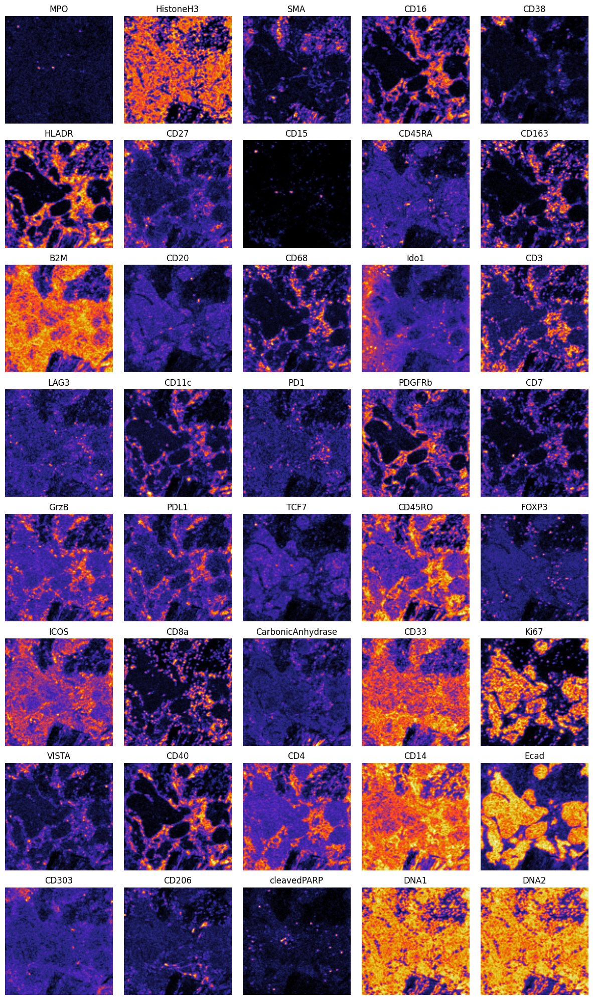

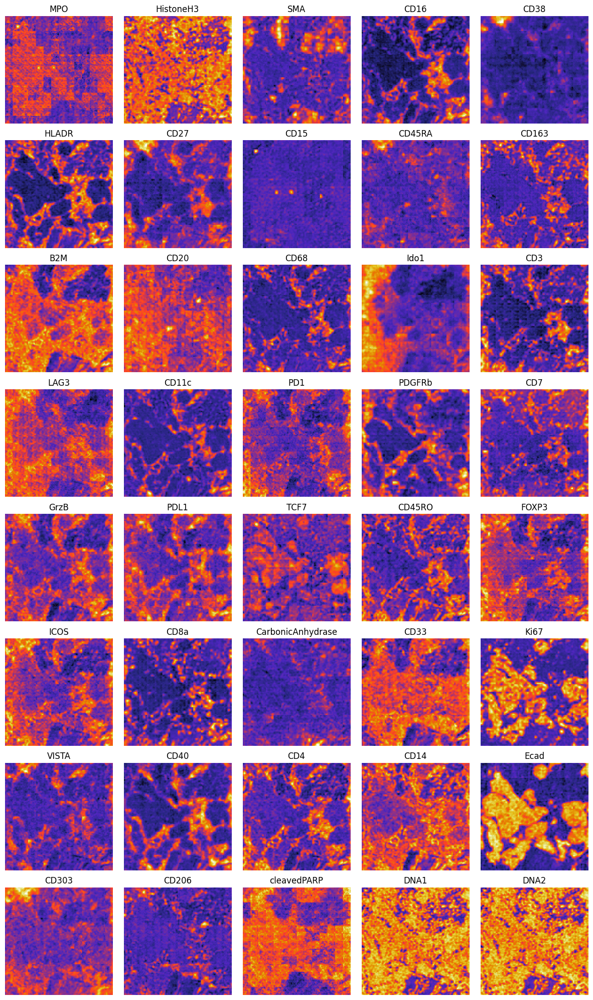

In [19]:
test_img, test_channel_ids = test_dataset[16]
test_img = test_img.to(torch.float32).to(device)
test_channel_ids = test_channel_ids.to(device)

test_img = test_img.unsqueeze(0)
test_channel_ids = test_channel_ids.unsqueeze(0)

with torch.no_grad():
    output, _ = model(test_img, test_channel_ids)

plot_markers(test_img.squeeze().cpu().numpy(), markers_names_map)
plot_markers(output.squeeze().cpu().numpy(), markers_names_map)

In [20]:
torch.save(model.state_dict(), 'model_autoencoder_simpl_conv.pth')

In [8]:
device = 'cuda' if torch.cuda.is_available() else 'mps'

encoder_layers_blocks = [6, 6, 6]
encoder_embedding_dims = [96, 192, 384]
# encoder_num_heads = [6, 6, 6]

decoder_dim = 192
decoder_blocks_num = 6
# decoder_num_heads = 6

# latent_dim = 384

model = MultiplexImageTransformer(
    channel_embedding_dim=96,
    num_channels=40,
    encoder_layers_blocks=encoder_layers_blocks,
    encoder_embedding_dims=encoder_embedding_dims,
    decoder_dim=decoder_dim,
    decoder_blocks_num=decoder_blocks_num,

).to(device)

In [9]:
lr = 5e-4
weight_decay = 0.001
gradient_accumulation_steps = 1
epochs = 40
optimizer = optim.AdamW(model.parameters(), lr=lr, weight_decay=weight_decay)

train(model, optimizer, train_dataloader, val_dataloader, device, epochs=epochs, gradient_accumulation_steps=gradient_accumulation_steps)

100%|██████████| 100/100 [01:50<00:00,  1.10s/it]


Epoch 0 loss: 0.03419236227869987
Validation loss: 0.010480201803147793


100%|██████████| 100/100 [01:49<00:00,  1.09s/it]


Epoch 1 loss: 0.012906626183539629
Validation loss: 0.008423768337816


100%|██████████| 100/100 [01:48<00:00,  1.09s/it]


Epoch 2 loss: 0.010659721670672298
Validation loss: 0.0074596753902733326


100%|██████████| 100/100 [01:49<00:00,  1.09s/it]


Epoch 3 loss: 0.010049995915032923
Validation loss: 0.007149465996772051


100%|██████████| 100/100 [01:48<00:00,  1.09s/it]


Epoch 4 loss: 0.009121991656720639
Validation loss: 0.006705377101898193


100%|██████████| 100/100 [01:49<00:00,  1.10s/it]


Epoch 5 loss: 0.008835794916376472
Validation loss: 0.005948613584041596


100%|██████████| 100/100 [01:50<00:00,  1.10s/it]


Epoch 6 loss: 0.007989403991959989
Validation loss: 0.0065487805474549535


100%|██████████| 100/100 [01:50<00:00,  1.10s/it]


Epoch 7 loss: 0.007381889985408634
Validation loss: 0.005932312849909067


100%|██████████| 100/100 [01:50<00:00,  1.10s/it]


Epoch 8 loss: 0.006930269526783377
Validation loss: 0.004677709573879838


100%|██████████| 100/100 [01:50<00:00,  1.11s/it]


Epoch 9 loss: 0.00640517002902925
Validation loss: 0.004498236989602447


100%|██████████| 100/100 [01:49<00:00,  1.10s/it]


Epoch 10 loss: 0.0059832377755083144
Validation loss: 0.00477208555676043


100%|██████████| 100/100 [01:49<00:00,  1.09s/it]


Epoch 11 loss: 0.005924134138040244
Validation loss: 0.003503168565221131


100%|██████████| 100/100 [01:49<00:00,  1.09s/it]


Epoch 12 loss: 0.005823601414449513
Validation loss: 0.0038749380176886917


100%|██████████| 100/100 [01:49<00:00,  1.09s/it]


Epoch 13 loss: 0.004992645673919469
Validation loss: 0.003471303656697273


100%|██████████| 100/100 [01:49<00:00,  1.09s/it]


Epoch 14 loss: 0.004890223375987261
Validation loss: 0.0031830850197002293


100%|██████████| 100/100 [01:49<00:00,  1.10s/it]


Epoch 15 loss: 0.004973382025491446
Validation loss: 0.0037314677983522416


100%|██████████| 100/100 [01:49<00:00,  1.09s/it]


Epoch 16 loss: 0.004406019863672554
Validation loss: 0.002852558814920485


100%|██████████| 100/100 [01:49<00:00,  1.09s/it]


Epoch 17 loss: 0.0045993348956108095
Validation loss: 0.0034156698547303677


100%|██████████| 100/100 [01:49<00:00,  1.09s/it]


Epoch 18 loss: 0.004301603646017611
Validation loss: 0.003669334929436445


100%|██████████| 100/100 [01:49<00:00,  1.09s/it]


Epoch 19 loss: 0.0042272029840387405
Validation loss: 0.002641882635653019


100%|██████████| 100/100 [01:48<00:00,  1.09s/it]


Epoch 20 loss: 0.003941179639659822
Validation loss: 0.0026019208831712603


100%|██████████| 100/100 [01:48<00:00,  1.09s/it]


Epoch 21 loss: 0.0038577978755347433
Validation loss: 0.0026787140732631087


100%|██████████| 100/100 [01:48<00:00,  1.09s/it]


Epoch 22 loss: 0.0037126243265811353
Validation loss: 0.002977620349265635


100%|██████████| 100/100 [01:48<00:00,  1.08s/it]


Epoch 23 loss: 0.003661412778310478
Validation loss: 0.002789765791967511


100%|██████████| 100/100 [01:48<00:00,  1.08s/it]


Epoch 24 loss: 0.003809344597393647
Validation loss: 0.003402145653963089


100%|██████████| 100/100 [01:48<00:00,  1.08s/it]


Epoch 25 loss: 0.0032859883166383953
Validation loss: 0.003346501290798187


100%|██████████| 100/100 [01:48<00:00,  1.08s/it]


Epoch 26 loss: 0.003177890644874424
Validation loss: 0.003846648023463786


100%|██████████| 100/100 [01:48<00:00,  1.08s/it]


Epoch 27 loss: 0.003357951998477802
Validation loss: 0.0031376497587189077


100%|██████████| 100/100 [01:48<00:00,  1.08s/it]


Epoch 28 loss: 0.0030822215718217193
Validation loss: 0.0030763662653043866


100%|██████████| 100/100 [01:48<00:00,  1.09s/it]


Epoch 29 loss: 0.0033527418714947997
Validation loss: 0.00349043695256114


100%|██████████| 100/100 [01:49<00:00,  1.10s/it]


Epoch 30 loss: 0.0030899391730781645
Validation loss: 0.0023695624666288497


100%|██████████| 100/100 [01:49<00:00,  1.10s/it]


Epoch 31 loss: 0.003328218940878287
Validation loss: 0.0027127150166779755


100%|██████████| 100/100 [01:49<00:00,  1.10s/it]


Epoch 32 loss: 0.0030696546880062668
Validation loss: 0.0031747331144288183


100%|██████████| 100/100 [01:49<00:00,  1.10s/it]


Epoch 33 loss: 0.0029806572780944405
Validation loss: 0.002872940478846431


100%|██████████| 100/100 [01:49<00:00,  1.10s/it]


Epoch 34 loss: 0.0031630211090669037
Validation loss: 0.0025836781179532408


100%|██████████| 100/100 [01:48<00:00,  1.09s/it]


Epoch 35 loss: 0.002835710608633235
Validation loss: 0.0028583188727498055


100%|██████████| 100/100 [01:48<00:00,  1.09s/it]


Epoch 36 loss: 0.0030554899980779738
Validation loss: 0.0042135948874056335


100%|██████████| 100/100 [01:48<00:00,  1.09s/it]


Epoch 37 loss: 0.0029754739149939267
Validation loss: 0.0033070984948426487


100%|██████████| 100/100 [01:48<00:00,  1.09s/it]


Epoch 38 loss: 0.0028324278455693274
Validation loss: 0.0036598378606140613


100%|██████████| 100/100 [01:48<00:00,  1.09s/it]


Epoch 39 loss: 0.0026577884575817736
Validation loss: 0.003588605974800885


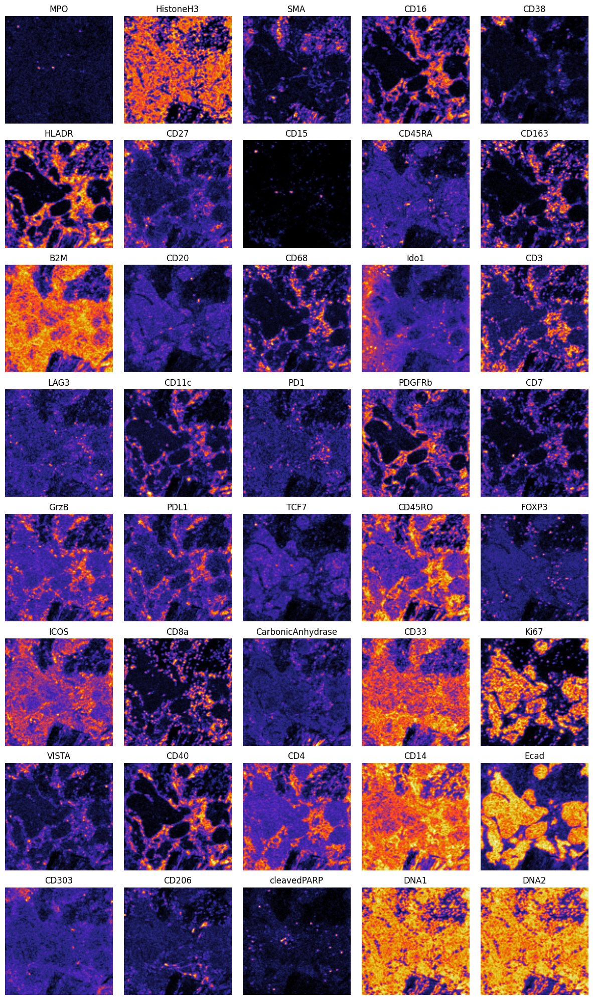

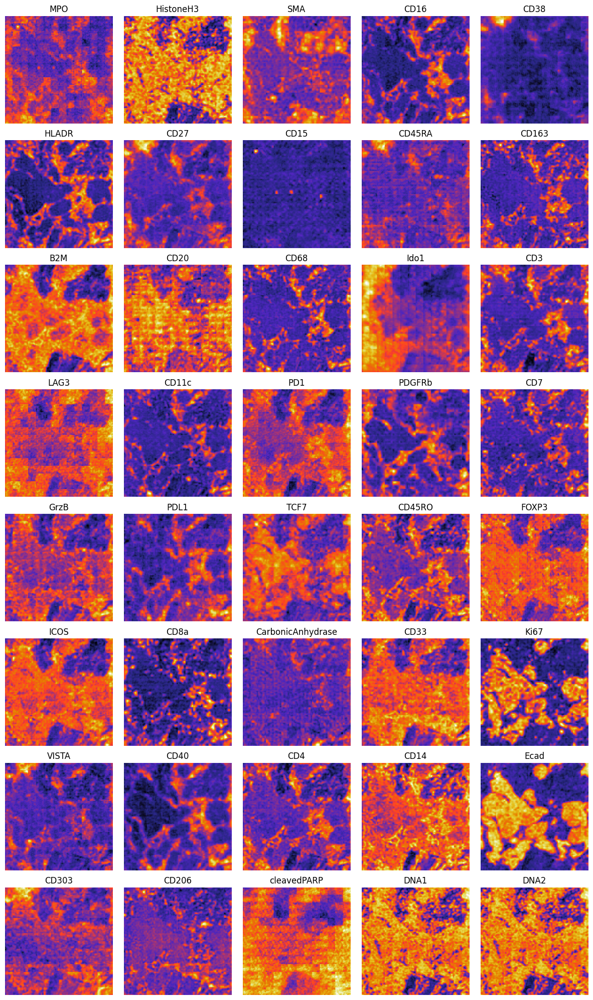

In [10]:
test_img, test_channel_ids = test_dataset[16]
test_img = test_img.to(torch.float32).to(device)
test_channel_ids = test_channel_ids.to(device)

test_img = test_img.unsqueeze(0)
test_channel_ids = test_channel_ids.unsqueeze(0)

with torch.no_grad():
    output, _ = model(test_img, test_channel_ids)

plot_markers(test_img.squeeze().cpu().numpy(), markers_names_map)
plot_markers(output.squeeze().cpu().numpy(), markers_names_map)